<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

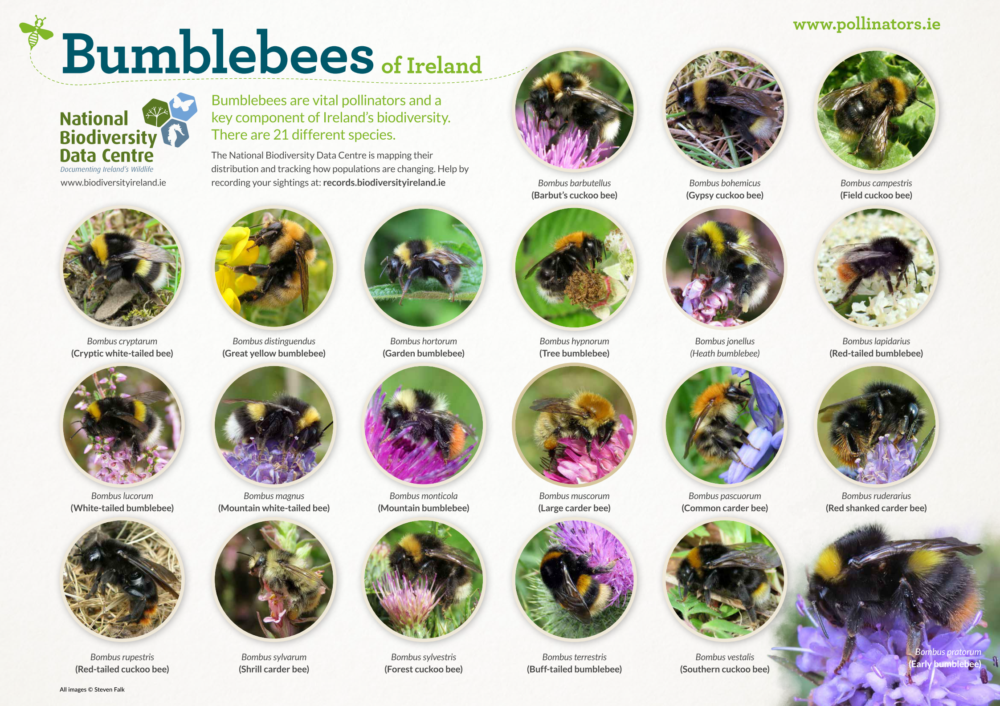

<br> </br>

In [1]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')

print(training_data_dir)
print(validate_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate


<br> </br>
- **Check the image in the train folder**

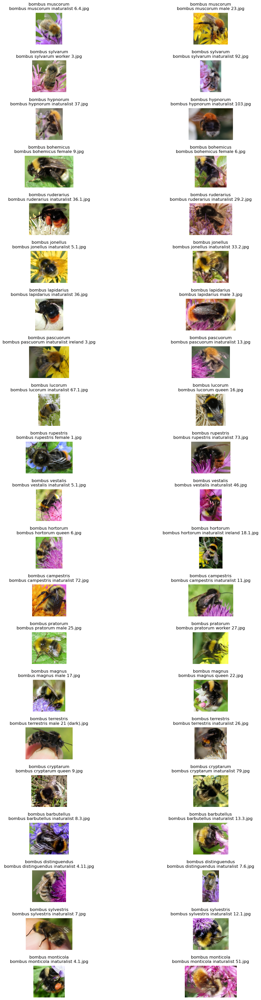

In [3]:
# Get the list of subdirectories (species)
species_list = [subdir.name for subdir in training_data_dir.glob('*')]

# Create a subplot grid
fig, axes = plt.subplots(21, 2, figsize=(15, 50))

# Adjust layout to provide space for titles
plt.subplots_adjust(hspace=0.5)

# Loop through each species
for i, species in enumerate(species_list):
    # Get two images from each species
    species_images = list(training_data_dir.glob(f'{species}/*'))[:2]

    # Loop through each image for the species
    for j, image_path in enumerate(species_images):
        image = Image.open(str(image_path))

        # Extract filename from path
        filename = os.path.basename(image_path)

        # Display the image on the subplot
        axes[i, j].imshow(image)
        axes[i, j].set_title(f'{species}\n{filename}', y=1.02)  # Adjust y position for title
        axes[i, j].axis('off')

plt.show()

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 3. Deep Learning Models Training using Pytorch </h1>

<br> </br>

In [4]:
# Import libraries
import pandas as pd

import time
import copy

from __future__ import print_function 
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torch.utils import data
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from torchvision.transforms import v2 as T
import torchvision.transforms.functional as TF

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [5]:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.1.0
Torchvision Version:  0.16.0


<br> </br>
- <h1 style="font-size: 16px"> Create functions for building and training pre-trained models in Pytorch. </h1>
<br> </br>

In [6]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [34]:
def initialize_model(model_name, num_classes, feature_extract):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None

    if model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_1(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[0] = nn.Dropout(p=0.6, inplace=False)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
    
    elif model_name == "densenet":
        """ Densenet121
        """
        model_ft = models.densenet121(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        #model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier = nn.Sequential(
            nn.Dropout(p=0.6, inplace=False),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == "mnasnet":
        """ MNASNET1_0
        """
        model_ft = models.mnasnet1_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier[0] = nn.Dropout(p=0.6, inplace=False)
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)
        model_ft.num_classes = num_classes

    elif model_name == "shufflenet":
        """ ShuffleNetV2
        """
        model_ft = models.shufflenet_v2_x2_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        #model_ft.fc = nn.Linear(num_ftrs, num_classes)
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier = nn.Sequential(
            nn.Dropout(p=0.6, inplace=False),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == "googlenet":
        """ GoogleNet
        """
        model_ft = models.googlenet(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.dropout = nn.Dropout(p=0.6, inplace=False)
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    else:
        print("Invalid model name, exiting...")
        exit()
    
    return model_ft

In [31]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_squeezenet=False):
    since = time.time()

    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Define StepLR scheduler
    step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=step_size, 
                                            gamma=gamma, verbose=True)

    # Define ReduceLROnPlateau scheduler
    reduce_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', 
                                                         factor=0.9, patience=2, 
                                                         verbose=True)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

        for phase in ['train', 'validate']:
            if phase == 'train':
                step_lr_scheduler.step()  # StepLR scheduler step
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_squeezenet and phase == 'train':
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        if not is_squeezenet and phase == 'train':
                            outputs, aux_outputs = outputs

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

            # Save information in history
            if phase == 'train':
                train_loss = epoch_loss
                train_accuracy = epoch_acc.item()
            elif phase == 'validate':
                validate_loss = epoch_loss
                validate_accuracy = epoch_acc.item()

            if phase == 'validate':
                reduce_lr_scheduler.step(epoch_acc)  # ReduceLROnPlateau scheduler step
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())

        history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])

        epoch_end = time.time()
        print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

    model.load_state_dict(best_model_wts)

    return model, history

<br> </br>
- ignore

In [ ]:
# def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False):
#     since = time.time()

#     history = []

#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0

#     device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     model = model.to(device)

#     for epoch in range(num_epochs):
#         epoch_start = time.time()
#         print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

#         for phase in ['train', 'validate']:
#             if phase == 'train':
#                 scheduler.step()
#                 model.train()
#             else:
#                 model.eval()

#             running_loss = 0.0
#             running_corrects = 0

#             for inputs, labels in dataloaders[phase]:
#                 inputs = inputs.to(device)
#                 labels = labels.to(device)

#                 optimizer.zero_grad()

#                 with torch.set_grad_enabled(phase == 'train'):
#                     if is_squeezenet and phase == 'train':
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)
#                     else:
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)

#                         if not is_squeezenet and phase == 'train':
#                             outputs, aux_outputs = outputs

#                     _, preds = torch.max(outputs, 1)

#                     if phase == 'train':
#                         loss.backward()
#                         optimizer.step()

#                 running_loss += loss.item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             epoch_loss = running_loss / len(dataloaders[phase].dataset)
#             epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

#             print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

#             # Save information in history
#             if phase == 'train':
#                 train_loss = epoch_loss
#                 train_accuracy = epoch_acc.item()
#             elif phase == 'validate':
#                 validate_loss = epoch_loss
#                 validate_accuracy = epoch_acc.item()
                
#             if phase == 'validate' and epoch_acc > best_acc:
#                 best_acc = epoch_acc
#                 best_model_wts = copy.deepcopy(model.state_dict())
        
#         history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])
        
#         epoch_end = time.time()
#         print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
#         print()

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

#     model.load_state_dict(best_model_wts)

#     return model, history

In [ ]:
# def train_model_with_early_stopping(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False, patience=5):
#     since = time.time()

#     history = []

#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0

#     device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     model = model.to(device)

#     counter = 0  # Counter for early stopping
#     early_stop = False

#     for epoch in range(num_epochs):
#         epoch_start = time.time()
#         print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

#         for phase in ['train', 'validate']:
#             if phase == 'train':
#                 scheduler.step()
#                 model.train()
#             else:
#                 model.eval()

#             running_loss = 0.0
#             running_corrects = 0

#             for inputs, labels in dataloaders[phase]:
#                 inputs = inputs.to(device)
#                 labels = labels.to(device)

#                 optimizer.zero_grad()

#                 with torch.set_grad_enabled(phase == 'train'):
#                     if is_squeezenet and phase == 'train':
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)
#                     else:
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)

#                         if not is_squeezenet and phase == 'train':
#                             outputs, aux_outputs = outputs

#                     _, preds = torch.max(outputs, 1)

#                     if phase == 'train':
#                         loss.backward()
#                         optimizer.step()

#                 running_loss += loss.item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             epoch_loss = running_loss / len(dataloaders[phase].dataset)
#             epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

#             print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

#             # Save information in history
#             if phase == 'train':
#                 train_loss = epoch_loss
#                 train_accuracy = epoch_acc.item()
#             elif phase == 'validate':
#                 validate_loss = epoch_loss
#                 validate_accuracy = epoch_acc.item()

#                 # Early stopping check
#                 if validate_accuracy > best_acc:
#                     best_acc = validate_accuracy
#                     best_model_wts = copy.deepcopy(model.state_dict())
#                     counter = 0  # Reset counter if there's an improvement
#                 else:
#                     counter += 1
#                     if counter >= patience:
#                         early_stop = True
#                         print("Early stopping triggered.")
#                         break

#         history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])

#         epoch_end = time.time()
#         print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
#         print()

#         if early_stop:
#             break  # Break out of the main loop if early stopping is triggered

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

#     model.load_state_dict(best_model_wts)

#     return model, history

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: orange"> Data Augmentation </h1>
<br> </br>

- <h1 style="font-size: 16px"> RandomPadding and cropping; some popular geometric transformation methods, such flipping and rotating; RandAugmentation </h1> </h1>
<br> </br>

In [10]:
# Applying Transforms to the Data
original_data_transform = { 
    'train': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'validate': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}

In [11]:
# Define data transformations for different augmentations
random_geometric_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(input_size),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(degrees=30),
    T.ColorJitter(brightness=0.2),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Specify the range for random padding
padding_range = (0, 40)

# Create the random zero padding transform
random_padding_transform = T.Compose([
    #T.RandomResize(input_size),
    #T.RandomResizedCrop(input_size),
    lambda img: TF.pad(img, tuple(random.randint(padding_range[0], 
                                                 padding_range[1]) for _ in range(4)), fill=0),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


randaugment_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(size=(input_size, input_size)),
    T.RandomApply([T.GaussianBlur(kernel_size=3)], p=0.5),
    T.RandomApply([T.RandomPosterize(bits=4)], p=0.5),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [12]:
# Load original dataset
original_train_dataset = datasets.ImageFolder(root=training_data_dir, 
                                              transform=original_data_transform['train'])

# Create augmented datasets
geometric_augmented_dataset = datasets.ImageFolder(root=training_data_dir, 
                                                   transform=random_geometric_transform)
    
random_padded_dataset = datasets.ImageFolder(root=training_data_dir, transform=random_padding_transform)

randaugment_dataset = datasets.ImageFolder(root=training_data_dir, 
                                           transform=randaugment_transform)

# Load validate dataset
validate_dataset = datasets.ImageFolder(root=validate_data_dir, 
                                        transform=original_data_transform['validate'])

In [13]:
##Spare one (ignore)

# random_padding_transform = T.Compose([
#     T.RandomResizedCrop(input_size),
#     T.Pad(padding=20, padding_mode='constant'),
#     T.Resize((input_size, input_size)),
#     T.ToTensor(),
#     T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

#random_padded_dataset = datasets.ImageFolder(root=training_data_dir, 
#                                              transform=random_padding_transform)

In [14]:
# Define a function to plot images
def plot_images(dataset, title):
    # Create a DataLoader for the dataset
    loader = DataLoader(dataset, batch_size=8, shuffle=True)
    
    # Retrieve a batch of images and labels
    images, labels = next(iter(loader))

    # Plotting code
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes = axes.flatten()

    for i in range(5):
        im = images[i].cpu().numpy().transpose((1, 2, 0))
        axes[i].imshow(im)
        axes[i].set_title(dataset.classes[labels[i]], size=10)
        axes[i].axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


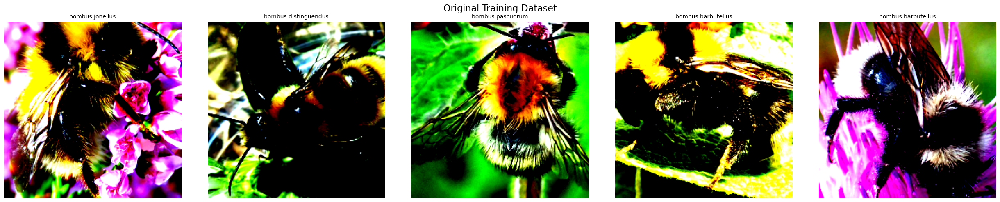

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


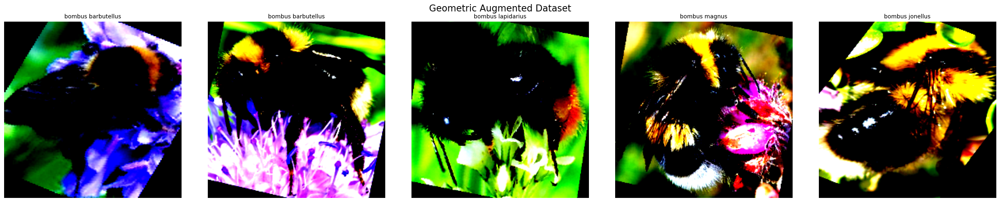

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


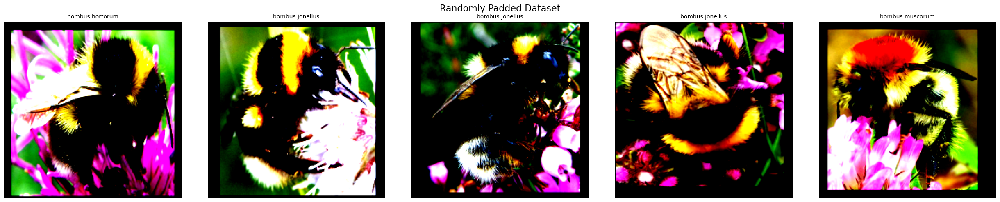

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


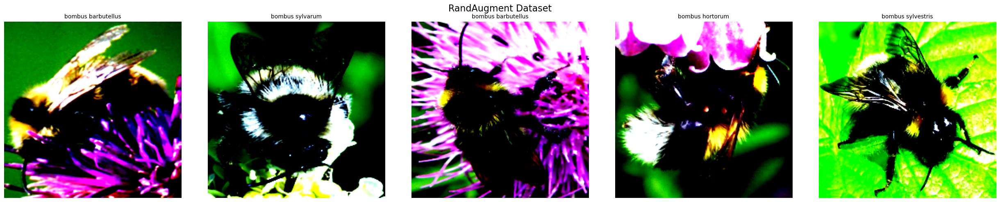

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


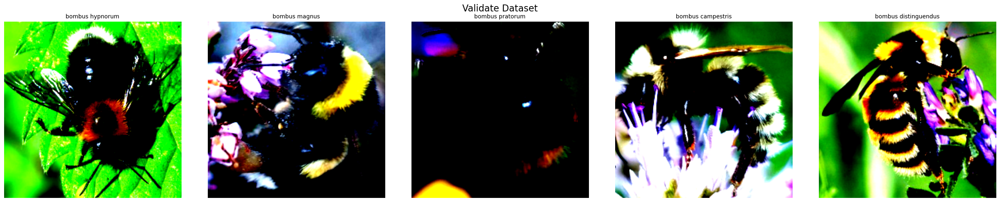

In [15]:
# Plot images from the original training dataset
plot_images(original_train_dataset, 'Original Training Dataset')

# Plot images from the geometric augmented dataset
plot_images(geometric_augmented_dataset, 'Geometric Augmented Dataset')

# Plot images from the randomly padded dataset
plot_images(random_padded_dataset, 'Randomly Padded Dataset')

# Plot images from the RandAugment dataset
plot_images(randaugment_dataset, 'RandAugment Dataset')

# Plot images from the validate dataset
plot_images(validate_dataset, 'Validate Dataset')

In [16]:
# Combine augmented datasets
combined_dataset = ConcatDataset([
    original_train_dataset,
    geometric_augmented_dataset,
    random_padded_dataset,
    randaugment_dataset
])

In [17]:
num_workers = 4

train_loader_final = DataLoader(combined_dataset, batch_size=batch_size, 
                                shuffle=True, num_workers=num_workers)
validate_dataloader = DataLoader(validate_dataset, batch_size=batch_size,
                                shuffle=True, num_workers=num_workers)

In [18]:
dataloaders_dict = {
    'train': train_loader_final,
    'validate': validate_dataloader
}

In [19]:
# Get a mapping of the indices to the class names, in order to see the output classes of the test images.
idx_to_class = {v: k for k, v in original_train_dataset.class_to_idx.items()}
print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [20]:
# Initialize an empty dictionary for the mapping
idx_to_class = {}

# Iterate through each dataset in the ConcatDataset
for dataset in combined_dataset.datasets:
    # Assuming each dataset has a 'class_to_idx' attribute
    idx_to_class.update({v: k for k, v in dataset.class_to_idx.items()})

print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [21]:
# Size of train and validate data
train_data_size = len(combined_dataset)
validate_data_size = len(validate_dataset)

print(train_data_size, validate_data_size)

12096 756


In [22]:
# Detect if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [9]:
# Number of classes
num_classes = len(os.listdir(training_data_dir))
print(num_classes)

# Batch size for training
batch_size = 32

# Set input size of the images
input_size = 224

21


In [23]:
# Number of epochs for training
num_epochs = 30

# Values for decaying
step_size = 8
gamma = 0.9

# Flag for feature extracting. When False, we finetune the whole model, 
# When True we only update the reshaped layer params
feature_extract = True

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.1 SqueezeNet1_1 </h1>
<br> </br>

In [35]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "squeezenet"

In [36]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model instantiated
print(model_ft)

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [37]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
#exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

Params to learn:
	 classifier.1.weight
	 classifier.1.bias


In [38]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [39]:
model_squeezenet, result_squeezenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, 
                                                  num_epochs=num_epochs,
                                                  is_squeezenet=(model_name=="squeezenet"))

Adjusting learning rate of group 0 to 1.0000e-03.
Epoch: 001/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 2.2794 Accuracy: 31.1508%
Validate Loss: 1.8838 Accuracy: 40.4762%
Epoch duration: 136.5074s

Epoch: 002/030
Adjusting learning rate of group 0 to 1.0000e-03.


KeyboardInterrupt: 

In [ ]:
# model_squeezenet, result_squeezenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="squeezenet"),
#                                                                       patience=15)

In [ ]:
torch.save(model_squeezenet.state_dict(), "model_squeezenet.pth")

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting results using Pytorch. </h1>
<br> </br>

In [ ]:
def plot_accuracy_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 1], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history[:, 3], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [ ]:
def plot_loss_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 0], label="Training Loss", color='green')
    plt.plot(epochs_range, history[:, 2], label="Validation Loss", color='blue', linestyle='--')
    
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [ ]:
def plot_confusion_matrix_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]  # Use class names from the mapping
    
    plt.figure(figsize=(14, 10))
    sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(conf_matrix[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xticks(rotation=45)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [ ]:
def plot_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [ ]:
def print_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print(f"Classification Report of {model_name} Model:\n", report)

In [ ]:
def plot_roc_curves_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            predictions.extend(outputs.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels, classes=np.unique(true_labels))
        true_labels_bin = true_labels_bin[:, class_index]

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="species names")

    plt.show()

<br> </br>

In [ ]:
plot_accuracy_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

In [ ]:
plot_loss_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

In [ ]:
plot_confusion_matrix_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                              idx_to_class, 'SqueezeNet1_1')

In [ ]:
plot_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                   idx_to_class, "SqueezeNet1_1")

In [ ]:
print_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                    idx_to_class, "SqueezeNet1_1")

In [ ]:
plot_roc_curves_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                        idx_to_class, "SqueezeNet1_1")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.2 DenseNet121 </h1>
<br> </br>

In [40]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "densenet"

In [41]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [42]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
#exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

Params to learn:
	 classifier.1.weight
	 classifier.1.bias


In [43]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_densenet, result_densenet = train_model(model_ft, dataloaders_dict, 
                                              criterion, optimizer_ft, 
                                              num_epochs=num_epochs, 
                                              is_squeezenet=(model_name=="densenet"))

Adjusting learning rate of group 0 to 1.0000e-03.
Epoch: 001/030
Adjusting learning rate of group 0 to 1.0000e-03.


In [ ]:
# model_densenet, result_densenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                   criterion, optimizer_ft,
#                                                                   exp_lr_scheduler, num_epochs=num_epochs,
#                                                                   is_squeezenet=(model_name=="densenet"),
#                                                                   patience=5)

In [ ]:
torch.save(model_densenet.state_dict(), "model_densenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_densenet, 'Densenet121')

In [ ]:
plot_loss_pytorch(num_epochs, result_densenet, 'Densenet121')

In [ ]:
plot_confusion_matrix_pytorch(model_densenet, dataloaders_dict['validate'], 
                              idx_to_class, 'Densenet121')

In [ ]:
plot_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                   idx_to_class, "Densenet121")

In [ ]:
print_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                    idx_to_class, "Densenet121")

In [ ]:
plot_roc_curves_pytorch(model_densenet, dataloaders_dict['validate'], 
                        idx_to_class, "Densenet121")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.3 ShuffleNetV2 </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "shufflenet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
#exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_shufflenet, result_shufflenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, 
                                                  num_epochs=num_epochs, 
                                                  is_squeezenet=(model_name=="shufflenet"))

In [ ]:
# model_shufflenet, result_shufflenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="shufflenet"),
#                                                                       patience=5)

In [ ]:
torch.save(model_shufflenet.state_dict(), "model_shufflenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

In [ ]:
plot_loss_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

In [ ]:
plot_confusion_matrix_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                              idx_to_class, 'ShuffleNetV2')

In [ ]:
plot_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                   idx_to_class, "ShuffleNetV2")

In [ ]:
print_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                    idx_to_class, "ShuffleNetV2")

In [ ]:
plot_roc_curves_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                        idx_to_class, "ShuffleNetV2")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.4 GoogleNet </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "googlenet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
#exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_googlenet, result_googlenet = train_model(model_ft, dataloaders_dict, 
                                                criterion, optimizer_ft, 
                                                num_epochs=num_epochs,
                                                is_squeezenet=(model_name=="googlenet"))

In [ ]:
# model_googlenet, result_googlenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                     criterion, optimizer_ft,
#                                                                     exp_lr_scheduler, num_epochs=num_epochs,
#                                                                     is_squeezenet=(model_name=="googlenet"),
#                                                                     patience=5)

In [ ]:
torch.save(model_googlenet.state_dict(), "model_googlenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_googlenet, 'GoogleNet')

In [ ]:
plot_loss_pytorch(num_epochs, result_googlenet, 'GoogleNet')

In [ ]:
plot_confusion_matrix_pytorch(model_googlenet, dataloaders_dict['validate'], 
                              idx_to_class, 'GoogleNet')

In [ ]:
plot_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                   idx_to_class, "GoogleNet")

In [ ]:
print_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                    idx_to_class, "GoogleNet")

In [ ]:
plot_roc_curves_pytorch(model_googlenet, dataloaders_dict['validate'], 
                        idx_to_class, "GoogleNet")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.5 MNASNET1_0 </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "mnasnet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
#exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_mnasnet, result_mnasnet = train_model(model_ft, dataloaders_dict, 
                                            criterion, optimizer_ft, 
                                            num_epochs=num_epochs,
                                            is_squeezenet=(model_name=="mnasnet"))

In [ ]:
# model_mnasnet, result_mnasnet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                 criterion, optimizer_ft,
#                                                                 exp_lr_scheduler, num_epochs=num_epochs,
#                                                                 is_squeezenet=(model_name=="mnasnet"),
#                                                                 patience=5)

In [ ]:
torch.save(model_mnasnet.state_dict(), "model_mnasnet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

In [ ]:
plot_loss_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

In [ ]:
plot_confusion_matrix_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                              idx_to_class, 'MNASNET1_0')

In [ ]:
plot_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                   idx_to_class, "MNASNET1_0")

In [ ]:
print_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                    idx_to_class, "MNASNET1_0")

In [ ]:
plot_roc_curves_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                        idx_to_class, "MNASNET1_0")